<a href="https://colab.research.google.com/github/Luis-Eduardo-P-Ch/Redes_Neuronales_C/blob/main/Redes_Neuronales_Clasificador_Perros%20y%20Gatos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import tensorflow as tf
import tensorflow_datasets as tfds

#Descargar el set de datos de perros y gatos

datos, metadatos = tfds.load('cats_vs_dogs', as_supervised= True, with_info= True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incompleteFH5AVT/cats_vs_dogs-train.tfrecord*...:   0%|…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


In [4]:
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir=PosixGPath('/tmp/tmp4_7rfdh6tfds'),
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
   

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

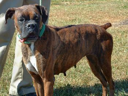
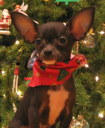
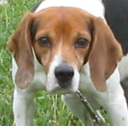
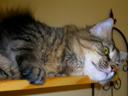
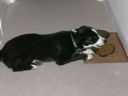

In [5]:
# Vemos algunas de la imagenes de conjunto de datos
tfds.as_dataframe(datos['train'].take(5), metadatos)

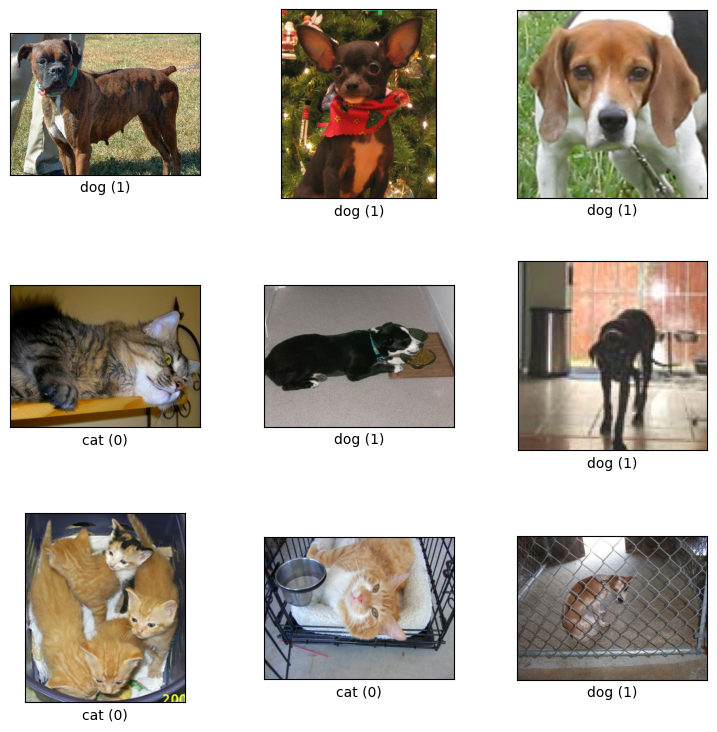

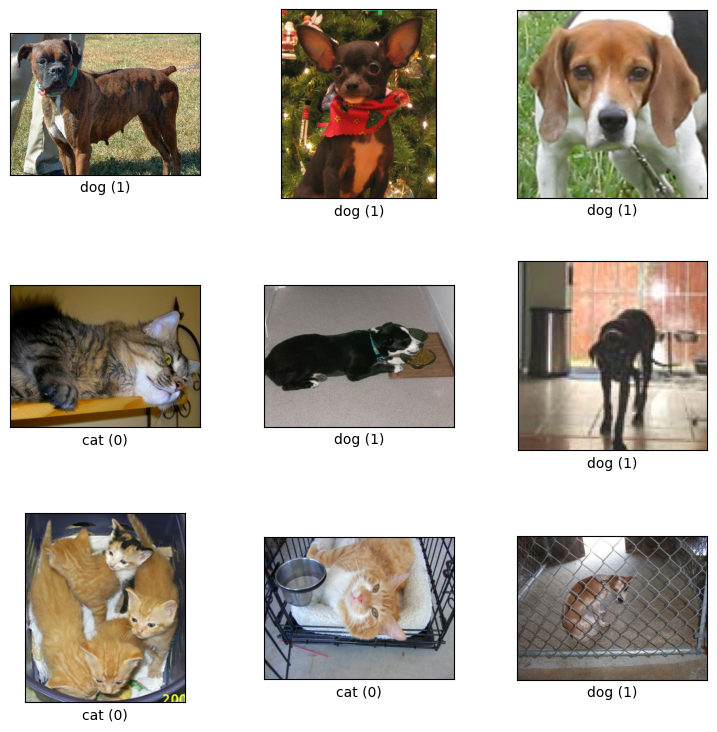

In [6]:
# Otra forma de ver algunas imagenes
tfds.show_examples(datos['train'], metadatos)

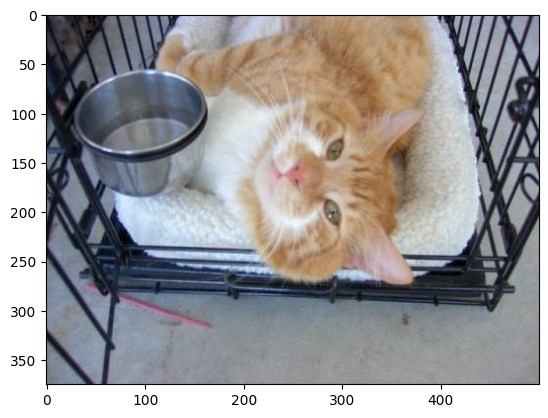

In [11]:
# Si queremos tener control total sobre lo que estamos viendo usemos mejor matplotlib
import matplotlib.pyplot as plt

# iteramos entre los datos (Mostrando solo una imagen)
for i, (imagen, etiqueta) in enumerate(datos['train'].take(8)):
  plt.imshow(imagen)



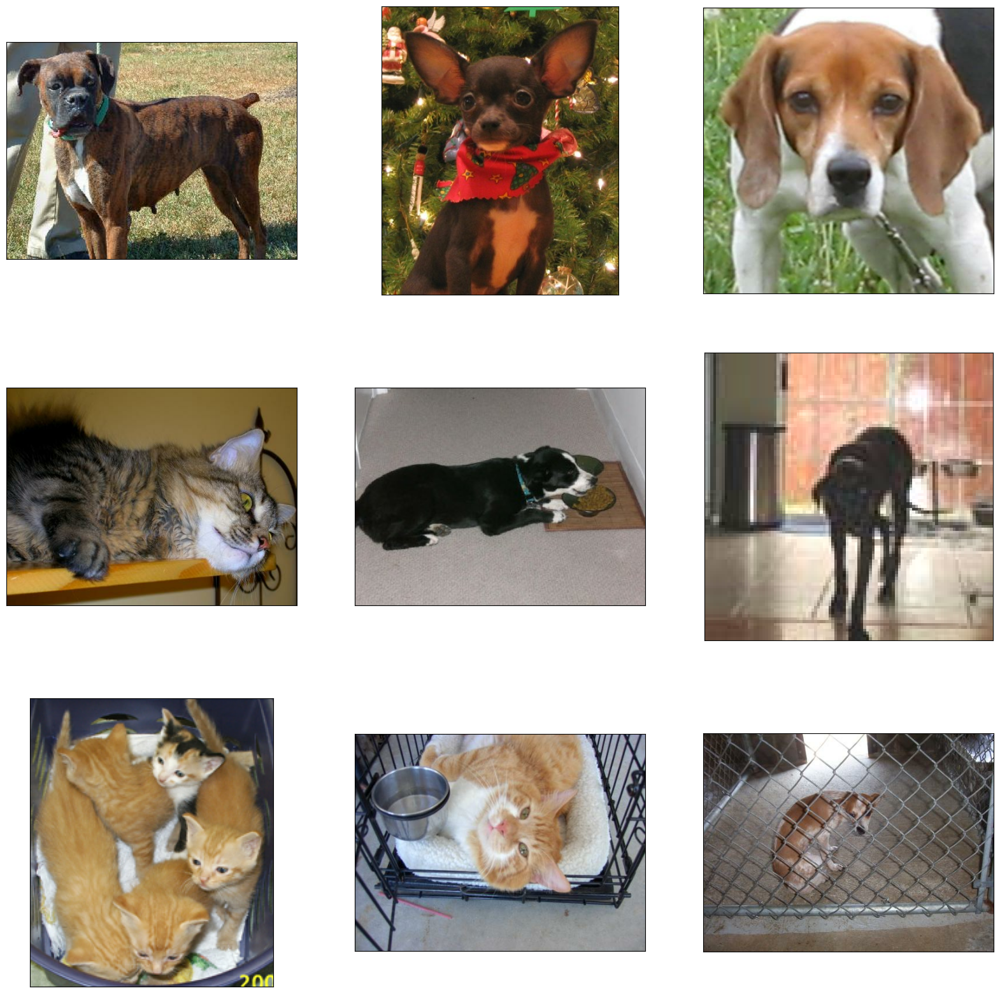

In [14]:
#Para mostrar varias

plt.figure(figsize=(20, 20)) # Para hacer las imagenes mas grandes


for i, (imagen, etiqueta) in enumerate(datos['train'].take(9)):

  plt.subplot(3, 3 , i+1)
  plt.xticks([])   # para quitar los valores de los ejes
  plt.yticks([])   # para quitar los valores de los ejes
  plt.imshow(imagen)

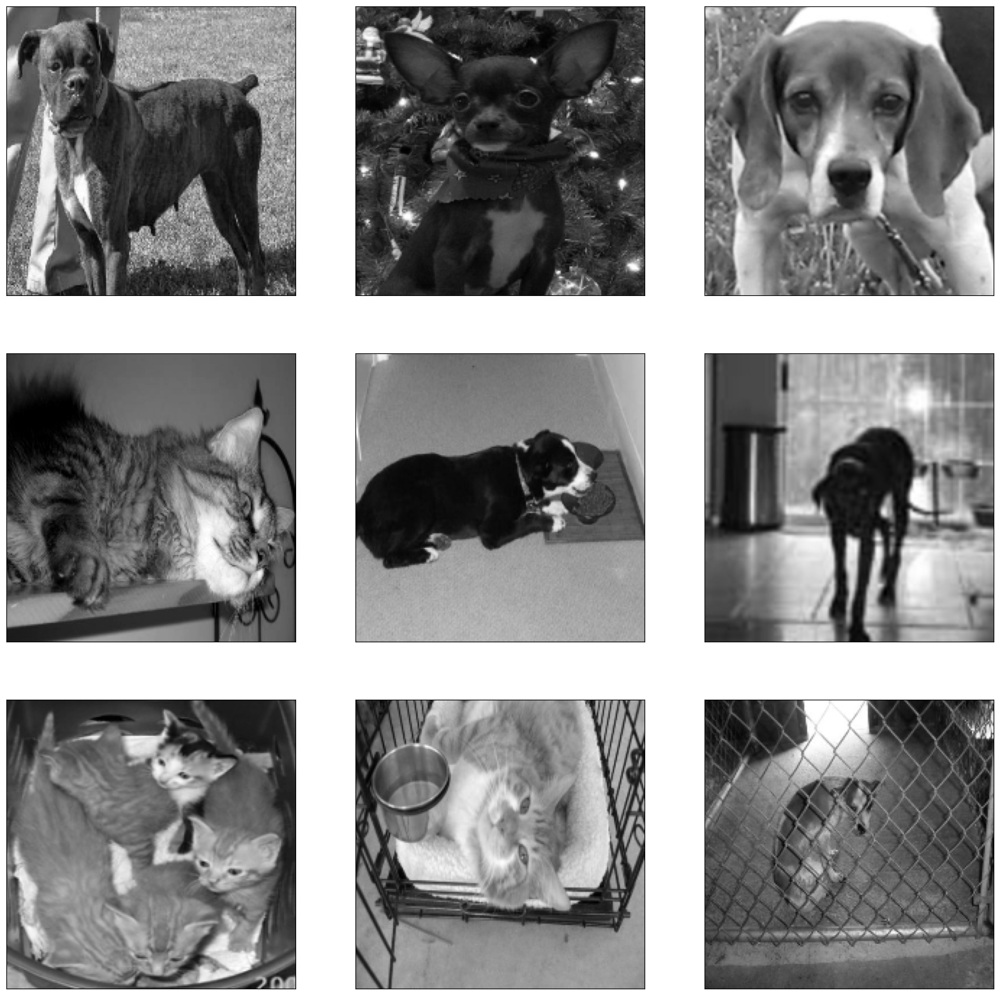

In [22]:
# Hacemos que todas las imagenes tengan el mismo tamaño ya que cada neurona tendra una cantidad fija de entrada
# Redimensiones de 200*200

import cv2

plt.figure(figsize=(20, 20)) # Para hacer las imagenes mas grandes

TAMANO_IMG=200      # para redimensionar a 200*200

for i, (imagen, etiqueta) in enumerate(datos['train'].take(9)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)    # Se reescala los colores (medio verdoso) pero en plt.show lo dejamos con gray para escala de grisis
  plt.subplot(3, 3 , i+1)
  plt.xticks([])   # para quitar los valores de los ejes
  plt.yticks([])   # para quitar los valores de los ejes
  plt.imshow(imagen, cmap='gray')      # cmap = 'gray' para tenerlo en escala de grises


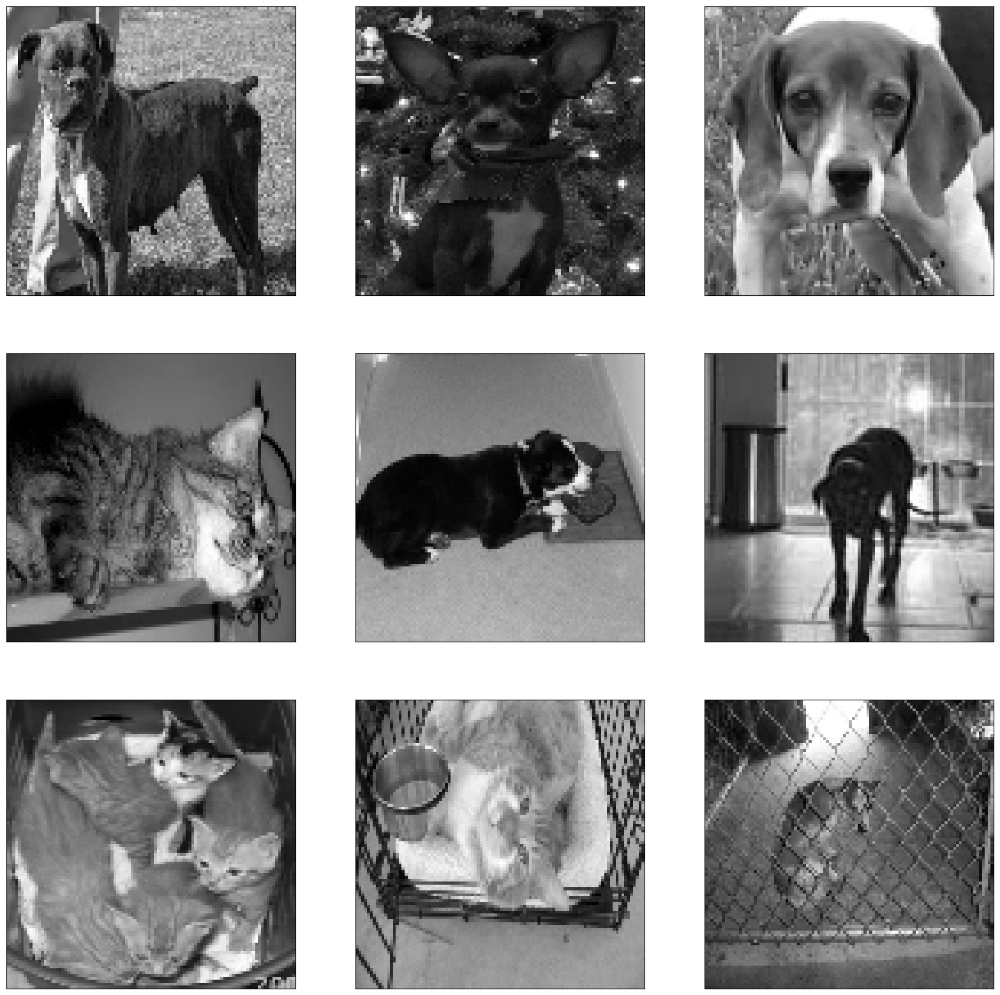

In [23]:
# nota mientras mas grande sea la imagen mas tardara la red en entrenar y predecir. Por lo cual vamos a ajustar el tamaño. Por lo tanto cambiamos el tamaño.
import cv2

plt.figure(figsize=(20, 20)) # Para hacer las imagenes mas grandes

TAMANO_IMG=100      # para redimensionar a 200*200

for i, (imagen, etiqueta) in enumerate(datos['train'].take(9)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)    # Se reescala los colores (medio verdoso) pero en plt.show lo dejamos con gray para escala de grisis
  plt.subplot(3, 3 , i+1)
  plt.xticks([])   # para quitar los valores de los ejes
  plt.yticks([])   # para quitar los valores de los ejes
  plt.imshow(imagen, cmap='gray')      # cmap = 'gray' para tenerlo en escala de grises


In [24]:
#creamos una base de entranamiento que sea una lista simple
datos_entrenamiento = []

In [26]:
for i, (imagen, etiqueta) in enumerate(datos['train']):  # iteramos en todos los datos de entrenamiento
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG)) # se hace la transformacion en cada imagen
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)    # Se reescala los colores (medio verdoso) pero en plt.show lo dejamos con gray para escala de grisis; Especificamos que las imagenes tienen un solo canal de color
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1 )     #Cambiamos tamaño a 100, 100, 1
  datos_entrenamiento.append([imagen, etiqueta])   # se le agrega la imagen modificada a la lista


In [27]:
# Imprimimos el primer indice

datos_entrenamiento[0]   # vemos todos los valores de los pixeles

[array([[[242],
         [190],
         [105],
         ...,
         [189],
         [195],
         [143]],
 
        [[230],
         [130],
         [ 88],
         ...,
         [188],
         [179],
         [187]],
 
        [[170],
         [ 93],
         [ 84],
         ...,
         [131],
         [158],
         [168]],
 
        ...,
 
        [[112],
         [173],
         [164],
         ...,
         [141],
         [152],
         [119]],
 
        [[140],
         [151],
         [172],
         ...,
         [ 96],
         [150],
         [152]],
 
        [[ 92],
         [112],
         [168],
         ...,
         [ 44],
         [ 52],
         [ 47]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [28]:
# imprimimos la longitud del arreglo
len(datos_entrenamiento)

23262

In [31]:
# Ahor preparamos un pocomo mejor los datos para el entrenamiento. Creamos dos variable separadas X e y

X = []   # imagenes de entradas (pixeles)
y = []   # etiquetas perro =1 o gato =0

for imagen, etiqueta in datos_entrenamiento:    #hacemos la iteracion para que cada variable tenga los valores correspondientes
    X.append(imagen)
    y.append(etiqueta)

In [32]:
# al imprimir nuevamente la X tenemos la lista de pixeles

X

[array([[[242],
         [190],
         [105],
         ...,
         [189],
         [195],
         [143]],
 
        [[230],
         [130],
         [ 88],
         ...,
         [188],
         [179],
         [187]],
 
        [[170],
         [ 93],
         [ 84],
         ...,
         [131],
         [158],
         [168]],
 
        ...,
 
        [[112],
         [173],
         [164],
         ...,
         [141],
         [152],
         [119]],
 
        [[140],
         [151],
         [172],
         ...,
         [ 96],
         [150],
         [152]],
 
        [[ 92],
         [112],
         [168],
         ...,
         [ 44],
         [ 52],
         [ 47]]], dtype=uint8),
 array([[[146],
         [115],
         [ 92],
         ...,
         [103],
         [ 72],
         [ 82]],
 
        [[128],
         [ 65],
         [ 77],
         ...,
         [128],
         [ 70],
         [ 97]],
 
        [[ 82],
         [ 66],
         [ 57],
         ...,
      

In [35]:
# Una transformacion mas que debemos hacer es tener valores entre 0 y 1. (es decir normalizarlos)
import numpy as np

X = np.array(X).astype(float) / 255    # dividido para 255 porque son 255 pixeles

X   # ya estan los pixeles normalizados

array([[[[0.94901961],
         [0.74509804],
         [0.41176471],
         ...,
         [0.74117647],
         [0.76470588],
         [0.56078431]],

        [[0.90196078],
         [0.50980392],
         [0.34509804],
         ...,
         [0.7372549 ],
         [0.70196078],
         [0.73333333]],

        [[0.66666667],
         [0.36470588],
         [0.32941176],
         ...,
         [0.51372549],
         [0.61960784],
         [0.65882353]],

        ...,

        [[0.43921569],
         [0.67843137],
         [0.64313725],
         ...,
         [0.55294118],
         [0.59607843],
         [0.46666667]],

        [[0.54901961],
         [0.59215686],
         [0.6745098 ],
         ...,
         [0.37647059],
         [0.58823529],
         [0.59607843]],

        [[0.36078431],
         [0.43921569],
         [0.65882353],
         ...,
         [0.17254902],
         [0.20392157],
         [0.18431373]]],


       [[[0.57254902],
         [0.45098039],
         [0.36

In [37]:
# Para el caso y, Quiero mostrar si es 0 si es un gato y un 1 si es un perro

y = np.array(y)
y

array([1, 1, 1, ..., 0, 1, 0])

In [38]:
# Como es la forma de la x?

X.shape      #El arreglo tiene 23262 entradas, cada una con una imagen de 100*100 con un canal de color (por ser en blanco y negro "escalas de grises")


(23262, 100, 100, 1)

In [43]:
# Ahora entrenamos el modelo.
# Empecemos con un modelo  Denso

modeloDenso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape= (100, 100, 1)),      # Capa de entrada que recibe 10,000 pixeles
    tf.keras.layers.Dense(150, activation= 'relu'),          # Dos capas densas de 150 neuronas cada una. capa Uno
    tf.keras.layers.Dense(150, activation= 'relu'),          # Capa dos
    tf.keras.layers.Dense(1, activation= 'sigmoid')          # Una sola capa de salida que devulve valor entre 0 y 1 dado que nuestros datos son asi

])

# El siguiente modelo es una red neuronal convolucional
modeloCNN = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation= 'relu', input_shape= (100, 100, 1)),      #Agregamos 3 pares de capas convolucionales y de agrupacion maxima pasando por 32, 64 y 128 filtros
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation= 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation= 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Flatten(),                               # finalmente una capa densa de 100 neuronas y la salida tambien con sigmoid
    tf.keras.layers.Dense(100, activation= 'relu'),
    tf.keras.layers.Dense(1, activation= 'sigmoid')

])

# Otro  modelo de una red neuronal convolucional pero agregando un drop out de 0.5 antes de la capa densa a la que se pondra 250 neuronas
modeloCNN2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation= 'relu', input_shape= (100, 100, 1)),      #Agregamos 3 pares de capas convolucionales y de agrupacion maxima pasando por 32, 64 y 128 filtros
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation= 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation= 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),                               # finalmente una capa densa de 100 neuronas y la salida tambien con sigmoid
    tf.keras.layers.Dense(250, activation= 'relu'),
    tf.keras.layers.Dense(1, activation= 'sigmoid')

])


In [44]:
#Compilamos los modelos todos con el optimizados Adam y la funcion de perdida se usara binary_crossentropy que aplica para resultados binarios

modeloDenso.compile(optimizer= 'adam',
                    loss= 'binary_crossentropy',
                    metrics=['accuracy'])


modeloCNN.compile(optimizer= 'adam',
                    loss= 'binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer= 'adam',
                    loss= 'binary_crossentropy',
                    metrics=['accuracy'])

In [45]:
# Antes de entrenarlos vamos a usar esta libreria para poder usar tansorflow y ver graficas de los modelos y ver como estan funcionando

from tensorflow.keras.callbacks import TensorBoard

In [48]:
# Creamos una variable llamada tensorboardDenso en la carpeta logs/denso

tensorboardDenso = TensorBoard(log_dir= 'logs/denso')     # esta carpeta debe ser distanta para cada modelo
#Entrenamos el modelo

modeloDenso.fit(X, y, batch_size=32,
                validation_split= 0.15,                    # validation:split permite dejar cuanto quiero para prueba
                epochs=20,                     #Cantidad de Epocas
                callbacks=[tensorboardDenso])       #Dspues de cada una de las 100 epocas va a llamar esta funcion y etsa funcion internamente guardara en disco el resultado de dica epoca de manera qe una vez que termine lo dejara todo en un archivo
                                                    #que podemos usar para visualizarlo en tensorboard

Epoch 1/20
618/618 [==============================] - 16s 25ms/step - loss: 0.6706 - accuracy: 0.5887 - val_loss: 0.6765 - val_accuracy: 0.5702
Epoch 2/20
618/618 [==============================] - 17s 27ms/step - loss: 0.6700 - accuracy: 0.5889 - val_loss: 0.6796 - val_accuracy: 0.5636
Epoch 3/20
618/618 [==============================] - 16s 25ms/step - loss: 0.6706 - accuracy: 0.5865 - val_loss: 0.6818 - val_accuracy: 0.5619
Epoch 4/20
618/618 [==============================] - 15s 25ms/step - loss: 0.6707 - accuracy: 0.5848 - val_loss: 0.6802 - val_accuracy: 0.5630
Epoch 5/20
618/618 [==============================] - 15s 25ms/step - loss: 0.6678 - accuracy: 0.5915 - val_loss: 0.6758 - val_accuracy: 0.5771
Epoch 6/20
618/618 [==============================] - 15s 25ms/step - loss: 0.6677 - accuracy: 0.5908 - val_loss: 0.6780 - val_accuracy: 0.5670
Epoch 7/20
618/618 [==============================] - 15s 25ms/step - loss: 0.6657 - accuracy: 0.5958 - val_loss: 0.6726 - val_accuracy:

In [51]:
# Como hariamos lo mismo con tensorboard.
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [76]:
# Lanzamos tensorboard y le indicamos donde estan nuestros logs

%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [56]:
# Ahora pasemos al modelo convolucional manejando ero cambiando la carpeta a logs/ cnn

tensorboardCNN = TensorBoard(log_dir= 'logs/cnn')     # esta carpeta debe ser distanta para cada modelo
#Entrenamos el modelo

modeloCNN.fit(X, y, batch_size=32,
                validation_split= 0.15,                    # validation:split permite dejar cuanto quiero para prueba
                epochs=5,                     #Cantidad de Epocas
                callbacks=[tensorboardCNN])       #Dspues de cada una de las 100 epocas va a llamar esta funcion y etsa funcion internamente guardara en disco el resultado de dica epoca de manera qe una vez que termine lo dejara todo en un archivo


Epoch 1/5
618/618 [==============================] - 468s 757ms/step - loss: 0.3988 - accuracy: 0.8176 - val_loss: 0.3848 - val_accuracy: 0.8287
Epoch 2/5
618/618 [==============================] - 384s 621ms/step - loss: 0.3410 - accuracy: 0.8490 - val_loss: 0.3571 - val_accuracy: 0.8393
Epoch 3/5
618/618 [==============================] - 416s 674ms/step - loss: 0.2832 - accuracy: 0.8785 - val_loss: 0.3918 - val_accuracy: 0.8289
Epoch 4/5
618/618 [==============================] - 434s 701ms/step - loss: 0.2231 - accuracy: 0.9067 - val_loss: 0.3649 - val_accuracy: 0.8358
Epoch 5/5
618/618 [==============================] - 408s 660ms/step - loss: 0.1688 - accuracy: 0.9309 - val_loss: 0.3727 - val_accuracy: 0.8516


In [57]:
tensorboardCNN2 = TensorBoard(log_dir= 'logs/cnn2')     # esta carpeta debe ser distanta para cada modelo
#Entrenamos el modelo

modeloCNN2.fit(X, y, batch_size=32,
                validation_split= 0.15,                    # validation:split permite dejar cuanto quiero para prueba
                epochs=3,                     #Cantidad de Epocas
                callbacks=[tensorboardCNN2])       #Dspues de cada una de las 100 epocas va a llamar esta funcion y etsa funcion internamente guardara en disco el resultado de dica epoca de manera qe una vez que termine lo dejara todo en un archivo


Epoch 1/3
618/618 [==============================] - 379s 610ms/step - loss: 0.6040 - accuracy: 0.6614 - val_loss: 0.5098 - val_accuracy: 0.7358
Epoch 2/3
618/618 [==============================] - 384s 621ms/step - loss: 0.4835 - accuracy: 0.7664 - val_loss: 0.4429 - val_accuracy: 0.7883
Epoch 3/3
618/618 [==============================] - 373s 604ms/step - loss: 0.4270 - accuracy: 0.8000 - val_loss: 0.4126 - val_accuracy: 0.8000


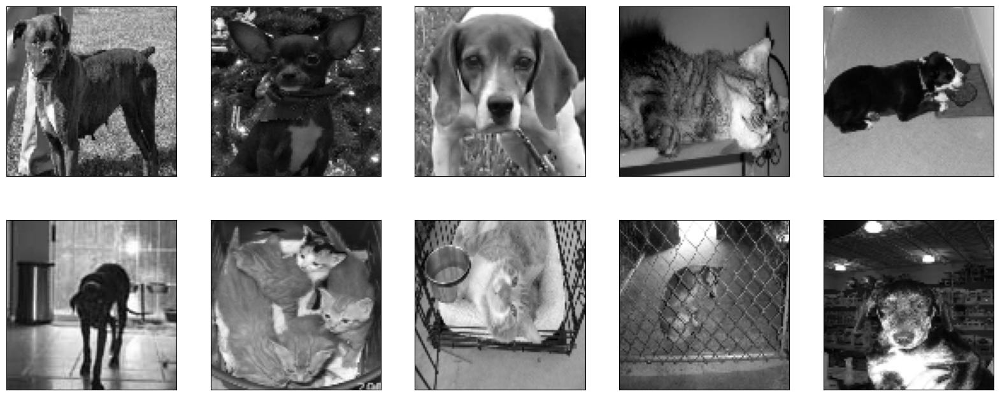

In [60]:
# Ahora como manejamos el aumento de datos?

# Mostramos las imagenes originales
plt.figure(figsize=(20, 8))

for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X[i].reshape(100, 100), cmap="gray")    # usamos reshape(100, 100) porque esta libreria se confunde si usamos mas de dos dimensiones


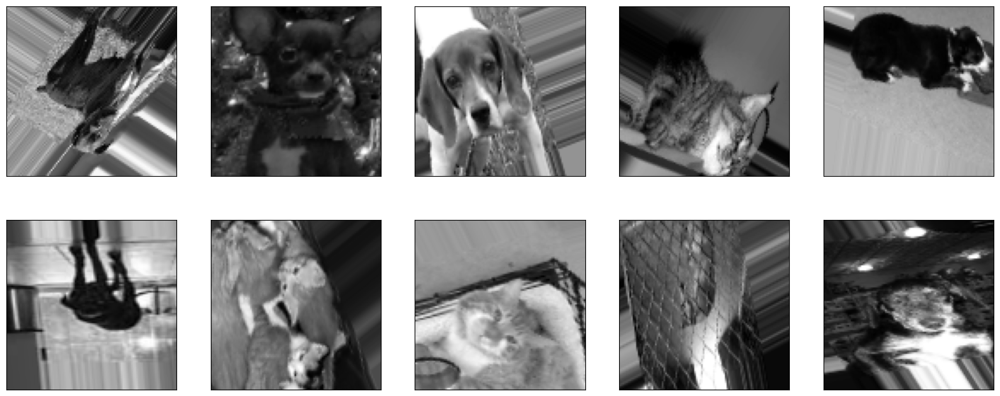

In [61]:
# Otra opcion

from tensorflow.keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    rotation_range=30,   # Rotacion aleatoria
    width_shift_range=0.2,    # Para mover datos hacia un lado entre 0 a 1
    height_shift_range=0.2,    # Para mover de arriba abajo
    shear_range=15,      # Hacemos que la imagen se incline
    zoom_range=[0.7, 1.4],    # Nos permite ver que tan pequeño o que tan grande puede ser un acercamiento
    horizontal_flip=True,  # Para hacer rotaciones horizontales
    vertical_flip= True    # Para hacer rotaciones verticales
)
datagen.fit(X)

plt.figure(figsize= (20, 8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle= False):
  for i in range(10):
   plt.subplot(2, 5, i+1)
   plt.xticks([])
   plt.yticks([])
   plt.imshow(imagen[i].reshape(100, 100), cmap= "gray")
  break

In [62]:
#  Una vez preparado el generador, el entrenamiento lo haremos diferente que la vez pasada ya que en lugar de usar la (x) y la (y) usaremos este generador.
# Los modelos son iguales

modeloDenso_AD = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape= (100, 100, 1)),      # Capa de entrada que recibe 10,000 pixeles
    tf.keras.layers.Dense(150, activation= 'relu'),          # Dos capas densas de 150 neuronas cada una. capa Uno
    tf.keras.layers.Dense(150, activation= 'relu'),          # Capa dos
    tf.keras.layers.Dense(1, activation= 'sigmoid')          # Una sola capa de salida que devulve valor entre 0 y 1 dado que nuestros datos son asi

])

# El siguiente modelo es una red neuronal convolucional
modeloCNN_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation= 'relu', input_shape= (100, 100, 1)),      #Agregamos 3 pares de capas convolucionales y de agrupacion maxima pasando por 32, 64 y 128 filtros
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation= 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation= 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Flatten(),                               # finalmente una capa densa de 100 neuronas y la salida tambien con sigmoid
    tf.keras.layers.Dense(100, activation= 'relu'),
    tf.keras.layers.Dense(1, activation= 'sigmoid')

])

# Otro  modelo de una red neuronal convolucional pero agregando un drop out de 0.5 antes de la capa densa a la que se pondra 250 neuronas
modeloCNN2_AD = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation= 'relu', input_shape= (100, 100, 1)),      #Agregamos 3 pares de capas convolucionales y de agrupacion maxima pasando por 32, 64 y 128 filtros
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation= 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation= 'relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),                               # finalmente una capa densa de 100 neuronas y la salida tambien con sigmoid
    tf.keras.layers.Dense(250, activation= 'relu'),
    tf.keras.layers.Dense(1, activation= 'sigmoid')

])



In [63]:
modeloDenso_AD.compile(optimizer= 'adam',
                    loss= 'binary_crossentropy',
                    metrics=['accuracy'])


modeloCNN_AD.compile(optimizer= 'adam',
                    loss= 'binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer= 'adam',
                    loss= 'binary_crossentropy',
                    metrics=['accuracy'])

In [64]:
# Ahora que vamos a usar aumentos de datos si debemos hacer la separacion en datos de entrenamiento y test

len(X) * .85
len(X) - 19700

3562

In [65]:
#Definimos las variables
X_entrenamiento = X[:19700]
X_validacion = X[19700:]

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [66]:
# Ahora preparamos el generador de datos transformados para el entrenamiento

data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)


In [71]:
# Ahora lo entrenamos.
# hacemos lo mismo que en el caso anterior
# defino una variable en una carpeta

tensorboardDenso_AD = TensorBoard(log_dir = 'logs/denso_AD')

modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs=3, batch_size=32,
    validation_data = (X_validacion, y_validacion),
    steps_per_epoch = int(np.ceil(len(X_entrenamiento)/ float(32))),
    validation_steps = int(np.ceil(len(X_validacion)/ float(32))),
    callbacks = [tensorboardDenso_AD]
    )

Epoch 1/3
616/616 [==============================] - 35s 56ms/step - loss: 0.6965 - accuracy: 0.5177 - val_loss: 0.6929 - val_accuracy: 0.5014
Epoch 2/3
616/616 [==============================] - 35s 57ms/step - loss: 0.6913 - accuracy: 0.5194 - val_loss: 0.6911 - val_accuracy: 0.5171
Epoch 3/3
616/616 [==============================] - 35s 56ms/step - loss: 0.6913 - accuracy: 0.5178 - val_loss: 0.6886 - val_accuracy: 0.5337


In [70]:
# Si estamos con poca memoria, podemos llamar esto como recolector de basura de python y liberar algo de memoria RAM
import gc
gc.collect()

44688

In [74]:
# Si bien no mejoro mucho el rendimiento dle modelo, pasemos ahora a entrenar el primer modeo convolcional con aumentos de datos

tensorboardCNN_AD = TensorBoard(log_dir = 'logs/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=3, batch_size=32,
    validation_data = (X_validacion, y_validacion),
    steps_per_epoch = int(np.ceil(len(X_entrenamiento)/ float(32))),
    validation_steps = int(np.ceil(len(X_validacion)/ float(32))),
    callbacks = [tensorboardCNN_AD]
    )

Epoch 1/3
616/616 [==============================] - 373s 605ms/step - loss: 0.6839 - accuracy: 0.5542 - val_loss: 0.6950 - val_accuracy: 0.5337
Epoch 2/3
616/616 [==============================] - 380s 617ms/step - loss: 0.6719 - accuracy: 0.5840 - val_loss: 0.7430 - val_accuracy: 0.5514
Epoch 3/3
616/616 [==============================] - 372s 603ms/step - loss: 0.6555 - accuracy: 0.6185 - val_loss: 0.6381 - val_accuracy: 0.6297


In [75]:
# Finalmente entrenemos el ultimo modelo

tensorboardCNN2_AD = TensorBoard(log_dir = 'logs/cnn2_AD')

modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=2, batch_size=32,
    validation_data = (X_validacion, y_validacion),
    steps_per_epoch = int(np.ceil(len(X_entrenamiento)/ float(32))),
    validation_steps = int(np.ceil(len(X_validacion)/ float(32))),
    callbacks = [tensorboardCNN2_AD]
    )

Epoch 1/2
616/616 [==============================] - 385s 623ms/step - loss: 0.6812 - accuracy: 0.5546 - val_loss: 0.7156 - val_accuracy: 0.5674
Epoch 2/2
616/616 [==============================] - 388s 630ms/step - loss: 0.6604 - accuracy: 0.6099 - val_loss: 0.6348 - val_accuracy: 0.6524
